In [1]:
using Baysor: DAT, REP, BPR, CLI, Utils
import Configurations
using DataFrames
using DataFramesMeta
using StatsBase
using NearestNeighbors
using Pipe: @pipe as @p
import Baysor
import ProgressMeter

ProgressMeter.ijulia_behavior(:clear);

In [2]:
INPUT_PATH = "../../../../data/human_ovarian_cancer/xenium_5k/transcripts.parquet";

In [3]:
opts = Configurations.from_toml(Utils.RunOptions, pkgdir(Baysor) * "/configs/xenium.toml");
data_opts = opts.data;

In [4]:
df_spatial, gene_names = DAT.load_df(
  INPUT_PATH, opts.data, filter_cols=true, extra_columns=[:cell_id]
);

Progress: 100%|█████████████████████████████████████████| Time: 0:00:07
┌ Warning: Genes BLANK_*,antisense_* are missing from the data
[ Info: Excluding 4132 genes
[ Info: Loaded 136564323 transcripts, 5101 genes.


In [5]:
CLI.fill_and_check_options!(opts, ":cell_id", "segmentation.csv");

## Initialization

In [6]:
run_id = CLI.get_run_id();

In [7]:
CLI.load_prior_segmentation!(
    df_spatial, ":cell_id", opts.segmentation;
    opts.data.min_molecules_per_cell, opts.data.min_molecules_per_segment
)

In [8]:
@time adj_list = BPR.build_molecule_graph(df_spatial);

794.363552 seconds (3.56 G allocations: 137.530 GiB, 6.68% gc time, 136910044 lock conflicts, 1.55% compilation time)


In [9]:
BPR.append_confidence!(df_spatial; nn_id=opts.data.confidence_nn_id, adj_list);

## Molecule clustering

In [ ]:
@time mol_clusts = BPR.cluster_molecules_on_mrf(df_spatial, adj_list; n_clusters=10, max_iters=2000);

In [ ]:
df_spatial[!, :cluster] = mol_clusts.assignment;

In [ ]:
REP.plot_molecules(
    @subset(df_spatial, :y .> 4200, :y .< 4500, :x .> 1250, :x .< 1600),
    annotation=:cluster, ticksvisible=true, markersize=1
)

## Segmentation

In [ ]:
opts.segmentation.n_cells_init = CLI.default_param_value(
    :n_cells_init, opts.data.min_molecules_per_cell; n_molecules=size(df_spatial, 1)
)

In [ ]:
opts.segmentation.scale

In [ ]:
@time init_params = BPR.cell_centers_uniformly(df_spatial, opts.segmentation.n_cells_init; scale=opts.segmentation.scale);

In [ ]:
size_prior = BPR.initialize_shape_prior(
    Float64(opts.segmentation.scale), parse(Float64, opts.segmentation.scale_std);
    opts.data.min_molecules_per_cell, is_3d=true
);

In [41]:
@time components, assignment = BPR.initial_distributions(init_params, length(gene_names); size_prior);

229.814316 seconds (213.81 M allocations: 269.264 GiB, 60.24% gc time, 0.12% compilation time)


In [44]:
std_vals = size_prior.std_values
noise_position_density = BPR.pdf(BPR.MultivariateNormal(zeros(length(std_vals)), diagm(0 => std_vals.^2)), 3 .* std_vals)

bm_data = BPR.BmmData(
    components, df_spatial, adj_list, init_params.assignment;
    prior_seg_confidence=0.5, noise_position_density
);

[ Info: Using the following additional information about molecules: [:confidence, :cluster, :prior_segmentation]


In [45]:
@time BPR.bmm!(bm_data; opts.data.min_molecules_per_cell, assignment_history_depth=100, n_iters=500);

┌ Warning: ProgressMeter by default refresh meters with additional information in IJulia via `IJulia.clear_output`, which clears all outputs in the cell. 
│  - To prevent this behaviour, do `ProgressMeter.ijulia_behavior(:append)`. 
│  - To disable this warning message, do `ProgressMeter.ijulia_behavior(:clear)`.
Progress: 100%|█████████████████████████████████████████| Time: 7:35:58
  Iteration:        500
  Noise level, %:   6.45
  Num. components:  510546


27850.832622 seconds (362.70 G allocations: 16.261 TiB, 28.34% gc time, 0.36% compilation time)


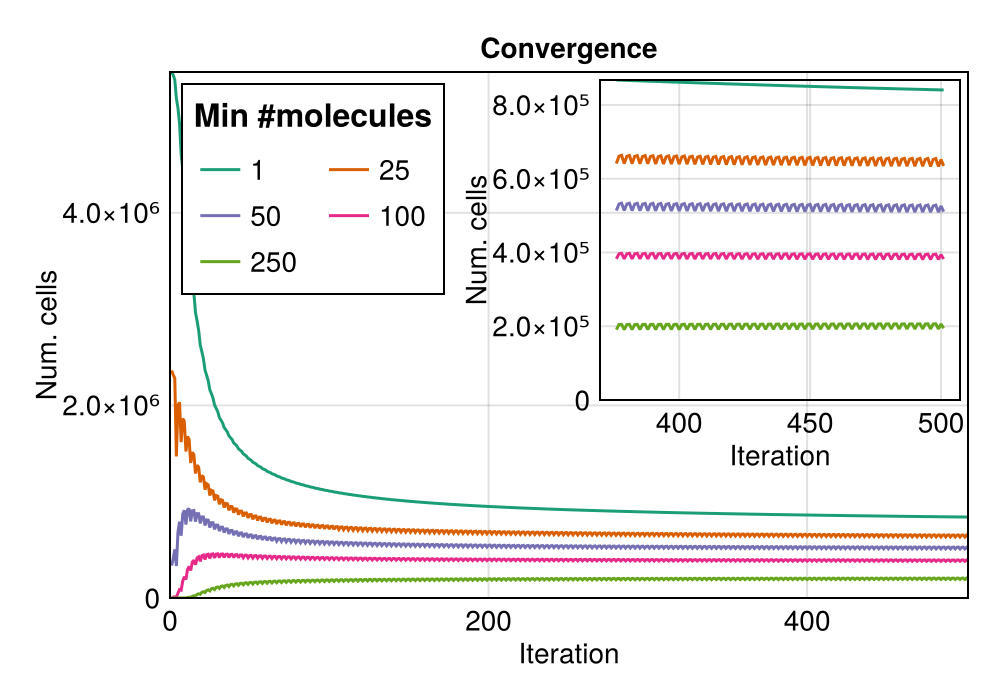

In [47]:
REP.plot_num_of_cells_per_iterarion(bm_data.tracer[:n_components])

### Save results

In [83]:
import Parquet

In [72]:
segmented_df, cell_stat_df, cm = BPR.get_segmentation_results(bm_data, gene_names; run_id);

In [74]:
@time poly_joined, polygons = BPR.boundary_polygons_auto(
    BPR.position_data(bm_data), bm_data.assignment; estimate_per_z=true, cell_names=cell_stat_df.cell
);

[ Info: Estimating boundary polygons
┌ Warning: To many values of z (2140). Binning z-stack into 10 layers for polygon estimation.
Progress: 100%|█████████████████████████████████████████| Time: 0:18:04


1754.179277 seconds (8.59 G allocations: 718.763 GiB, 11.42% gc time, 167900258 lock conflicts, 0.10% compilation time)


In [7]:
out_paths = BPR.get_output_paths(
    dirname(INPUT_PATH) * "/seg_method_results/baysor/";
    count_matrix_format="mtx"
);

In [107]:
import MatrixMarket

MatrixMarket.mmwrite(out_paths.counts * "matrix.mtx.gz", cm)

open(out_paths.counts * "genes.tsv", "w") do io
    println(io, join(gene_names, "\n"))
end

open(out_paths.counts * "barcodes.tsv", "w") do io
    println(io, join(cell_stat_df.cell, "\n"))
end

In [84]:
Parquet.write_parquet(
    splitext(out_paths.segmented_df)[1] * ".parquet",
    segmented_df
)

4

### Plot subset

In [66]:
p_df = BPR.get_segmentation_df(bm_data, gene_names; run_id);
p_df[!, :cell_id] = bm_data.assignment;

p_df = @subset(p_df, :y .> 4200, :y .< 4500, :x .> 1250, :x .< 1600) |> deepcopy;

In [70]:
polygons = BPR.boundary_polygons(BPR.position_data(p_df), p_df.cell_id);
length(polygons)

2631

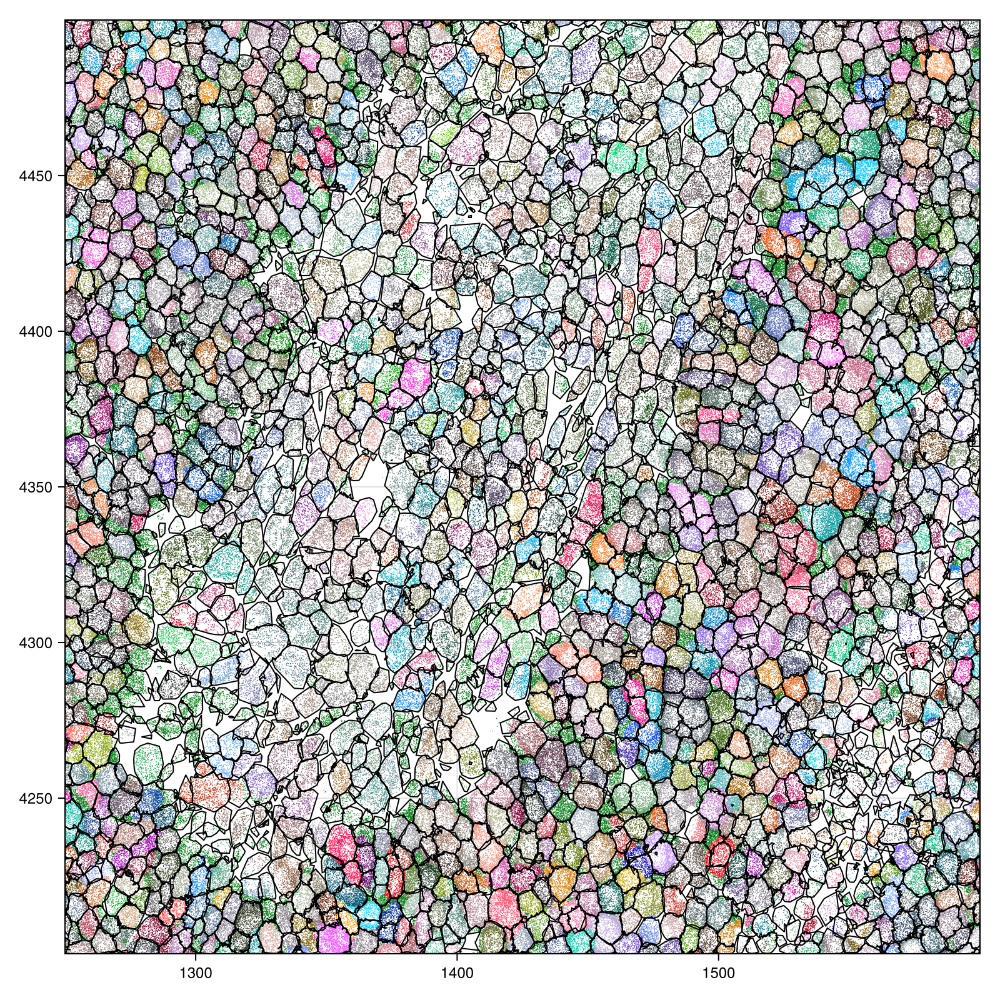

In [71]:
REP.plot_molecules(
    p_df, polygons, ticksvisible=true, markersize=1, annotation=:prior_segmentation, legend=false
)